In [ ]:
import os

from cv2 import imwrite, imread, resize, INTER_AREA
from google.colab.patches import cv2_imshow

from cvpanorama import HarrisCornerDetection
from cvpanorama.PanoramaStitching import stitch_two_images

harris_threshold = 0.20
ransacIterations = 150
ransacThreshold = 5
imgdir = "cvpanorama/imgs"
outdir = "out"

!mkdir {outdir} ;

In [72]:
!rm -Rf cvpanorama ;
!git clone https://github.com/douglasgoodwin/cvpanorama.git

Cloning into 'cvpanorama'...
remote: Enumerating objects: 51, done.
remote: Counting objects: 100% (51/51), done.
remote: Compressing objects: 100% (50/50), done.
remote: Total 51 (delta 13), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (51/51), 11.43 MiB | 9.20 MiB/s, done.
Resolving deltas: 100% (13/13), done.


In [ ]:
from os.path import isfile

def stitch_me(imgroot, imgrange, ransacIterations, ransacThreshold):
    print(f"working on {imgroot}")
    stem = imgroot.split("/")[-1]
    ext = "jpg"
    if isfile(f"{imgroot}1.jpeg"):
        ext = "jpeg"
    if isfile(f"{imgroot}1.png"):
        ext = "png"

    for i in range(1, imgrange):  # We want to load imgs 3 - imgrange
        if i > 1:
            im1 = stitched_image
            print(f"Stitching stitched_image to {imgroot}{i+1}.{ext}")
        else:
            im1 = imread(f"{imgroot}{i}.{ext}")
            print(f"Stitching {imgroot}{i}.{ext} to {imgroot}{i+1}.{ext}")
        im2 = imread(f"{imgroot}{i+1}.{ext}")
        stitched_image = stitch_two_images(im1, im2,
                                          siftDisplayName="",
                                          siftFilePath="",
                                          saveSiftMatches=False,
                                          ransacDisplayName=f"{i+2}. RANSAC Matches for R1-{i-1} and {stem}{i} (R1-{i})",
                                          saveRansacMatches=False,
                                          ransacFilePath="",
                                          ransacIterations=ransacIterations,
                                          ransacThreshold=ransacThreshold
                                          )

    stitched_file_path = f"{outdir}/stitched_{stem}.png"
    imwrite(stitched_file_path, stitched_image)
    print(f"{stem} All Stitched saved to {stitched_file_path}")

    return stitched_image

working on cvpanorama/imgs/Rainier
Stitching cvpanorama/imgs/Rainier1.png to cvpanorama/imgs/Rainier2.png
	maxInliers updated 22
	maxInliers updated 443
	maxInliers updated 447
	Transferring pixels from the second image to the stitched image
Stitching stitched_image to cvpanorama/imgs/Rainier3.png
	maxInliers updated 232
	maxInliers updated 250
	maxInliers updated 252
	Transferring pixels from the second image to the stitched image
Stitching stitched_image to cvpanorama/imgs/Rainier4.png
	maxInliers updated 96
	maxInliers updated 167
	maxInliers updated 206
	Transferring pixels from the second image to the stitched image
Stitching stitched_image to cvpanorama/imgs/Rainier5.png
	maxInliers updated 6
	maxInliers updated 524
	maxInliers updated 526
	Transferring pixels from the second image to the stitched image
Stitching stitched_image to cvpanorama/imgs/Rainier6.png
	maxInliers updated 8
	maxInliers updated 15
	maxInliers updated 169
	maxInliers updated 205
	maxInliers updated 206
	Tran

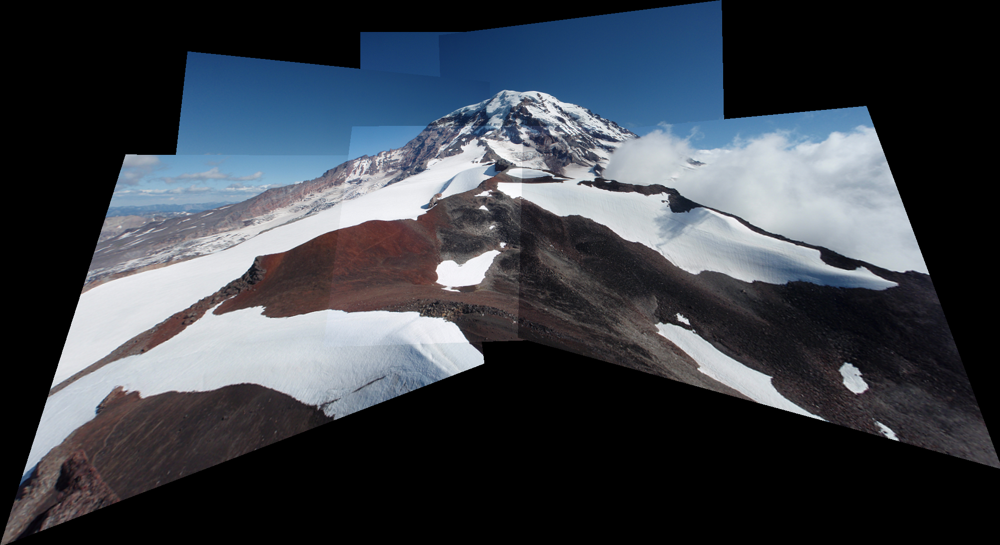

In [64]:
imgroot = f"{imgdir}/Rainier"
imgrange = 6
stitchedimg = stitch_me(imgroot, imgrange, ransacIterations, ransacThreshold)

cv2_imshow(stitchedimg)

working on cvpanorama/imgs/clivia_
Stitching cvpanorama/imgs/clivia_1.jpg to cvpanorama/imgs/clivia_2.jpg
	maxInliers updated 18
	maxInliers updated 243
	maxInliers updated 264
	maxInliers updated 286
	maxInliers updated 289
	Transferring pixels from the second image to the stitched image
Stitching stitched_image to cvpanorama/imgs/clivia_3.jpg
	maxInliers updated 109
	maxInliers updated 156
	maxInliers updated 211
	maxInliers updated 239
	maxInliers updated 311
	maxInliers updated 381
	Transferring pixels from the second image to the stitched image
clivia_ All Stitched saved to out/stitched_clivia_.png


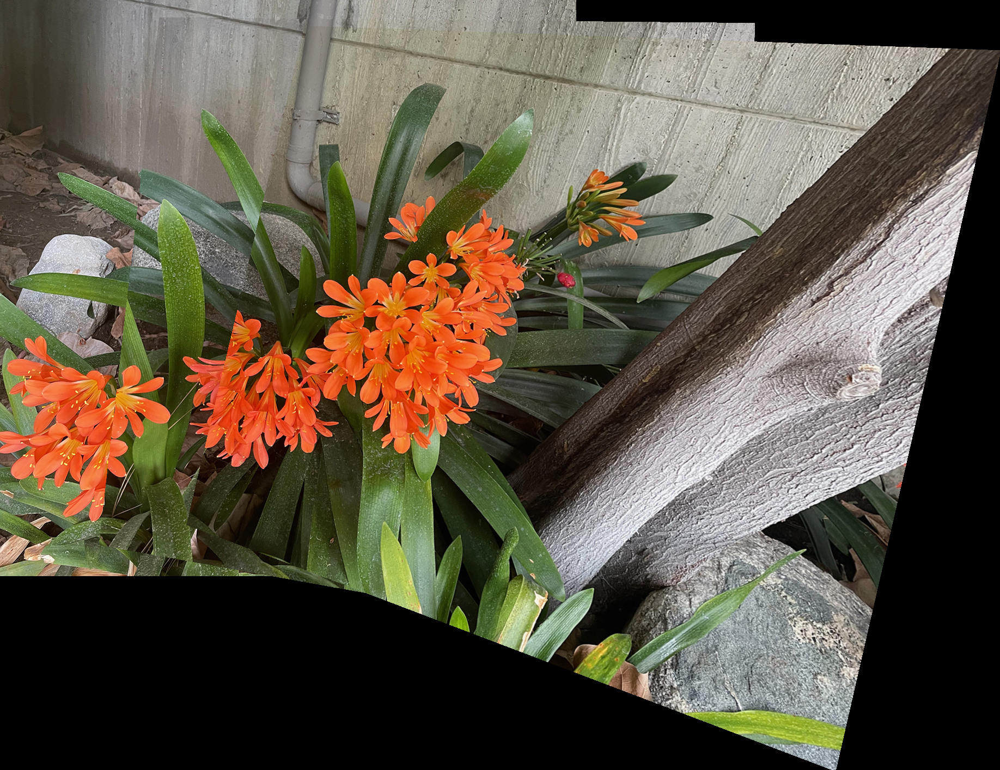

In [66]:
imgroot = f"{imgdir}/clivia_"
imgrange = 3
stitchedimg = stitch_me(imgroot, imgrange, ransacIterations, ransacThreshold)

cv2_imshow(stitchedimg)

working on cvpanorama/imgs/class_
Stitching cvpanorama/imgs/class_1.jpg to cvpanorama/imgs/class_2.jpg
	maxInliers updated 6
	maxInliers updated 357
	Transferring pixels from the second image to the stitched image
class_ All Stitched saved to out/stitched_class_.png


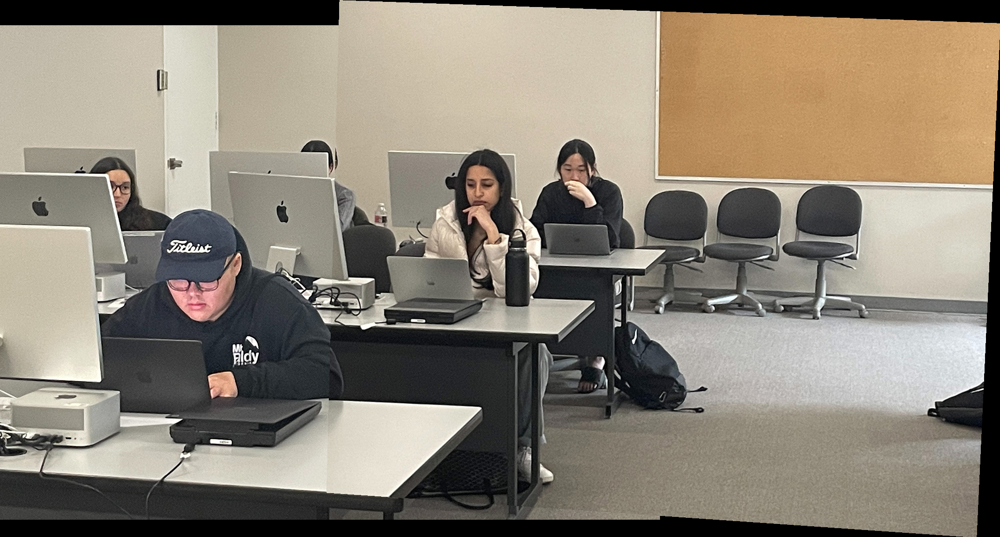

In [74]:
imgroot = f"{imgdir}/class_"
imgrange = 2
stitchedimg = stitch_me(imgroot, imgrange, ransacIterations, ransacThreshold)

cv2_imshow(stitchedimg)